<a href="https://colab.research.google.com/github/Andresssg/Tesis/blob/main/Counting/Test1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!pip install ultralytics
!pip install supervision==0.4.0
!pip install moviepy
!pip install mysql-connector-python

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 529.8/529.8 kB 29.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 198.8/198.8 kB 25.7 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 27.4/27.4 MB 61.3 MB/s eta 0:00:00


In [3]:
import os
import cv2
from ultralytics import YOLO
import supervision as sv


In [66]:
video_name = 'people.mp4'
#Copiar files
!cp '/content/drive/MyDrive/Proyecto de grado (Conteo personas)/Dataset/metrics/100epoch_clean/detect/train/weights/best.pt' /content
!cp '/content/drive/MyDrive/Proyecto de grado (Conteo personas)/Videos/'{video_name} /content
!cp '/content/drive/MyDrive/Proyecto de grado (Conteo personas)/Scripts/envDB.txt' /content

In [67]:
video_path = f"/content/{video_name}"
model_path = "/content/best.pt"
video_path_out = f"/content/out_{video_name}"
print(video_path)
print(model_path)
print(video_path_out)

/content/people.mp4
/content/best.pt
/content/out_people.mp4


In [68]:
#Cargar modelo 
#model = YOLO(model_path)
model = YOLO("yolov8n.pt")
#results = model.track(source=video_path, tracker="botsort.yaml", save=True, conf=0.5)

In [69]:
import os

cap = cv2.VideoCapture(video_path)

ret, frame = cap.read()
H, W, _ = frame.shape

#os.remove("video_out.mp4")


out = cv2.VideoWriter(video_path_out, cv2.VideoWriter_fourcc(*'MP4V'), int(cap.get(cv2.CAP_PROP_FPS)), (W, H))


In [79]:

#Se definen los estilos de la caja
box_annotator = sv.BoxAnnotator(
    thickness=2,
    text_thickness=1,
    text_scale=0.5
)

#Se definen los puntos donde ve va a ubicar la linea
START = sv.Point(0, H/1.5)
END = sv.Point(W, H/1.5)

#Se definen los estilos de la linea y se colocan los puntos inicial y final
line_zone = sv.LineZone(start=START, end=END)

line_zone_annotator = sv.LineZoneAnnotator(
    thickness=2,
    text_thickness=1,
    text_scale=0.5,
)

#frame_count = 0

#Se itera cada frame del video
for result in model.track(source=video_path, stream=True, verbose=True, save=True):

    #if frame_count == 0:
      #print('-----------', result)
      #frame_count+=1
    
    #Se obtiene el frame
    frame = result.orig_img
    #Se obtienen las coordenadas y toda la informacion asociada a la deteccion
    detections = sv.Detections.from_yolov8(result)
    
    if result.boxes.id is not None:
        detections.tracker_id = result.boxes.id.cpu().numpy().astype(int)

    detections = detections[detections.class_id == 0]
    labels = [
        f"{tracker_id} {model.model.names[class_id]} {confidence:0.2f}"
        for _, confidence, class_id, tracker_id
        in detections
    ]

    frame = box_annotator.annotate(scene=frame, detections=detections, labels=labels)
    
    line_zone.trigger(detections=detections)
    line_zone_annotator.annotate(frame=frame, line_counter=line_zone)

    out.write(frame)

    #frame_count += 1
    #if frame_count >= 50:
        #break
        

print(line_zone.in_count)
print(line_zone.out_count)

out.release()
cap.release()



video 1/1 (1/341) /content/people.mp4: 384x640 12 persons, 2 birds, 6.7ms
video 1/1 (2/341) /content/people.mp4: 384x640 12 persons, 2 birds, 6.0ms
video 1/1 (3/341) /content/people.mp4: 384x640 13 persons, 2 birds, 8.0ms
video 1/1 (4/341) /content/people.mp4: 384x640 13 persons, 2 birds, 7.7ms
video 1/1 (5/341) /content/people.mp4: 384x640 15 persons, 2 birds, 6.2ms
video 1/1 (6/341) /content/people.mp4: 384x640 15 persons, 2 birds, 11.6ms
video 1/1 (7/341) /content/people.mp4: 384x640 15 persons, 2 birds, 7.4ms
video 1/1 (8/341) /content/people.mp4: 384x640 15 persons, 2 birds, 7.5ms
video 1/1 (9/341) /content/people.mp4: 384x640 17 persons, 2 birds, 6.1ms
video 1/1 (10/341) /content/people.mp4: 384x640 18 persons, 2 birds, 6.5ms
video 1/1 (11/341) /content/people.mp4: 384x640 18 persons, 2 birds, 10.9ms
video 1/1 (12/341) /content/people.mp4: 384x640 19 persons, 2 birds, 11.6ms
video 1/1 (13/341) /content/people.mp4: 384x640 20 persons, 2 birds, 11.4ms
video 1/1 (14/341) /content/p

5
9


In [80]:
from IPython.display import HTML

HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % video_path_out)

MoviePy - Building file /content/video.gif with imageio.


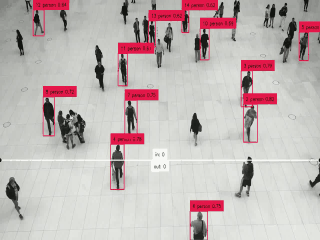

In [81]:
from moviepy.editor import *

# Cargar el archivo de video MP4

video = VideoFileClip(video_path_out)

# Obtener la duración del video y establecer la duración del GIF
duration = video.duration
gif_duration = min(10, duration) # Duración del GIF: 10 segundos o la duración del video si es menor a 10 segundos

# Crear el archivo de animación GIF
gif_path = "/content/video.gif"
video.subclip(0, gif_duration).resize((320, 240)).write_gif(gif_path, fps=15)

# Mostrar el archivo de animación GIF en el cuaderno
from IPython.display import Image
Image(open(gif_path, 'rb').read())

In [ ]:
#Leer credenciales DB
credentials = []
with open('/content/envDB.txt') as env:
  for line in env:
    credentials.append(line.strip())

In [83]:
#Conexion DB
import mysql.connector

db = mysql.connector.connect(
    host=credentials[0],
    user=credentials[1],
    password=credentials[2],
    database=credentials[3]
)

print(db)

In [84]:
#Insertar datos a la tabla de conteo de personas

cursor = db.cursor()
query = "INSERT INTO conteos (ingreso_personas, salida_personas) VALUES (%s, %s);"
values = (line_zone.in_count, line_zone.out_count)
cursor.execute(query,values)

db.commit()

In [85]:
#Imprimir consulta con pandas
import pandas as pd

query = "SELECT * FROM conteos"
df = pd.read_sql(query, con=db)
df.head

  df = pd.read_sql(query, con=db)



<bound method NDFrame.head of    id_conteo  ingreso_personas  salida_personas
0          1                10                5
1          2                 7                9
2          3                 8                8
3          4                 0                0
4          5                11                3
5          6                 5                9
6          7                 5                9>

In [86]:
#Enviar a drive
!cp {video_path_out} '/content/drive/MyDrive/Proyecto de grado (Conteo personas)/Videos/'
!cp '/content/runs/detect/track2/'{video_name} '/content/drive/MyDrive/Proyecto de grado (Conteo personas)/Videos/out2_'{video_name}

In [87]:
import shutil

#shutil.rmtree('/content/runs')